In [130]:
#Importing the Libraries

import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize']=(12,8) #Adjust the configuration of the plots we will create

#Read in the data
df = pd.read_csv(r'C:\Users\dataa\Downloads\movies.csv')

In [132]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [134]:
#we need to see if we have any missing values
#Let's loop through the data and see if there are any missing values present
for col in df.columns :
    pct_missing = np.mean(df[col].isnull())
    print('{}--{}%'.format(col,round(pct_missing*100)))



name--0%
rating--1%
genre--0%
year--0%
released--0%
score--0%
votes--0%
director--0%
writer--0%
star--0%
country--0%
budget--28%
gross--2%
company--0%
runtime--0%


In [136]:
#Filling the nan values
df['budget']=df['budget'].fillna(df['budget'].mean())
df['gross']=df['gross'].fillna(df['gross'].mean())


In [138]:
df['rating']=df['rating'].fillna(method='ffill')

C:\Users\dataa\AppData\Local\Temp\ipykernel_1932\4224506788.py:1: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['rating']=df['rating'].fillna(method='ffill')


In [140]:
#we need to see if we have any missing values
#Let's loop through the data and see if there are any missing values present
for col in df.columns :
    pct_missing = np.mean(df[col].isnull())
    print('{}--{}%'.format(col,round(pct_missing*100)))



name--0%
rating--0%
genre--0%
year--0%
released--0%
score--0%
votes--0%
director--0%
writer--0%
star--0%
country--0%
budget--0%
gross--0%
company--0%
runtime--0%


In [142]:
#Checking data types of all columns



print(df.dtypes)

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object


In [144]:

df['budget']=df['budget'].astype('int64')
df['gross']=df['gross'].astype('int64')

In [146]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0


In [19]:
df['year_correct']=df['released'].astype(str).str.split(',',expand=True)[1].str.split(' ',expand=True)[1]

In [148]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0


In [23]:
df.sort_values(by=['gross'],inplace=False,ascending=False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,year_correct
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,2009
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,2019
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,1997
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,2015
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,2018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3818,"Love, Honor and Obey",R,Comedy,2000,"February 9, 2001 (United States)",6.5,5200.0,Dominic Anciano,Dominic Anciano,Sadie Frost,United Kingdom,35589876,1400,British Broadcasting Corporation (BBC),103.0,2001
7625,The Untold Story,Not Rated,Comedy,2019,"January 11, 2019 (United States)",5.7,320.0,Shane Stanley,Lee Stanley,Miko Hughes,United States,35589876,790,Visual Arts Entertainment,104.0,2019
7580,Run with the Hunted,Not Rated,Crime,2019,"June 26, 2020 (United States)",5.2,735.0,John Swab,John Swab,Ron Perlman,United States,35589876,682,Roxwell Films,93.0,2020
2417,Madadayo,PG,Drama,1993,"April 17, 1993 (Japan)",7.3,5100.0,Akira Kurosawa,Ishirô Honda,Tatsuo Matsumura,Japan,11900000,596,DENTSU Music And Entertainment,134.0,1993


In [150]:
pd.set_option('display.max_rows',None)

In [152]:
df.sort_values(by=['gross'],inplace=False,ascending=False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0
7480,The Lion King,PG,Animation,2019,"July 19, 2019 (United States)",6.9,222000.0,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118.0
6653,Jurassic World,PG-13,Action,2015,"June 12, 2015 (United States)",7.0,593000.0,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,Universal Pictures,124.0
6043,The Avengers,PG-13,Action,2012,"May 4, 2012 (United States)",8.0,1300000.0,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143.0
6646,Furious 7,PG-13,Action,2015,"April 3, 2015 (United States)",7.1,370000.0,James Wan,Chris Morgan,Vin Diesel,United States,190000000,1515341399,Universal Pictures,137.0
7494,Frozen II,PG,Animation,2019,"November 22, 2019 (United States)",6.8,148000.0,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000,1450026933,Walt Disney Animation Studios,103.0


In [153]:
df['name'].sort_values(ascending=False)

4722                                             Æon Flux
4761                              xXx: State of the Union
7112                           xXx: Return of Xander Cage
4083                                                  xXx
3503                                             eXistenZ
5642                                               [Rec]²
166                                  Zorro: The Gay Blade
6863                                             Zootopia
180                                             Zoot Suit
4984                                                 Zoom
6962                                          Zoolander 2
3880                                            Zoolander
5931                                            Zookeeper
7489                               Zombieland: Double Tap
5456                                           Zombieland
6615                                           Zombeavers
5048                                               Zodiac
5926          

In [156]:
df['name'].value_counts()

name
Nobody's Fool                                                                          3
Hercules                                                                               3
Anna                                                                                   3
Hamlet                                                                                 3
Fever Pitch                                                                            3
Venom                                                                                  3
Pulse                                                                                  3
Annie                                                                                  2
Poltergeist                                                                            2
Paradise                                                                               2
Wuthering Heights                                                                      2
The Guardian    

In [158]:
#Drop duplicates
df['company'].sort_values(ascending=False)

7129                                              thefyzz
5664                                          micro_scope
6412                             iDeal Partners Film Fund
4007                                             i5 Films
6793                                           i am OTHER
6420                                                 erbp
3776                                       double A Films
524                             Zupnik-Curtis Enterprises
3330                          Zucker Brothers Productions
447                                      Zoetrope Studios
302                                      Zoetrope Studios
724                                      Zoetrope Studios
520                                      Zoetrope Studios
352                                      Zoetrope Studios
332                                      Zoetrope Studios
146                                      Zoetrope Studios
2213                                   Zeta Entertainment
6222          

In [160]:
df['name'].value_counts()

name
Nobody's Fool                                                                          3
Hercules                                                                               3
Anna                                                                                   3
Hamlet                                                                                 3
Fever Pitch                                                                            3
Venom                                                                                  3
Pulse                                                                                  3
Annie                                                                                  2
Poltergeist                                                                            2
Paradise                                                                               2
Wuthering Heights                                                                      2
The Guardian    

In [162]:
df=df.drop_duplicates(subset=['name'])

In [164]:
df['name'].value_counts()

name
The Shining                                                                            1
Hot Fuzz                                                                               1
Hot Rod                                                                                1
Ghost Rider                                                                            1
Grindhouse                                                                             1
Sweeney Todd: the Demon Barber of Fleet Street                                         1
Knocked Up                                                                             1
The Mist                                                                               1
Enchanted                                                                              1
Hitman                                                                                 1
28 Weeks Later                                                                         1
Juno            

### Correlation

In [167]:
#Guess
#Budget vs Gross High correlation
#Company High Relation

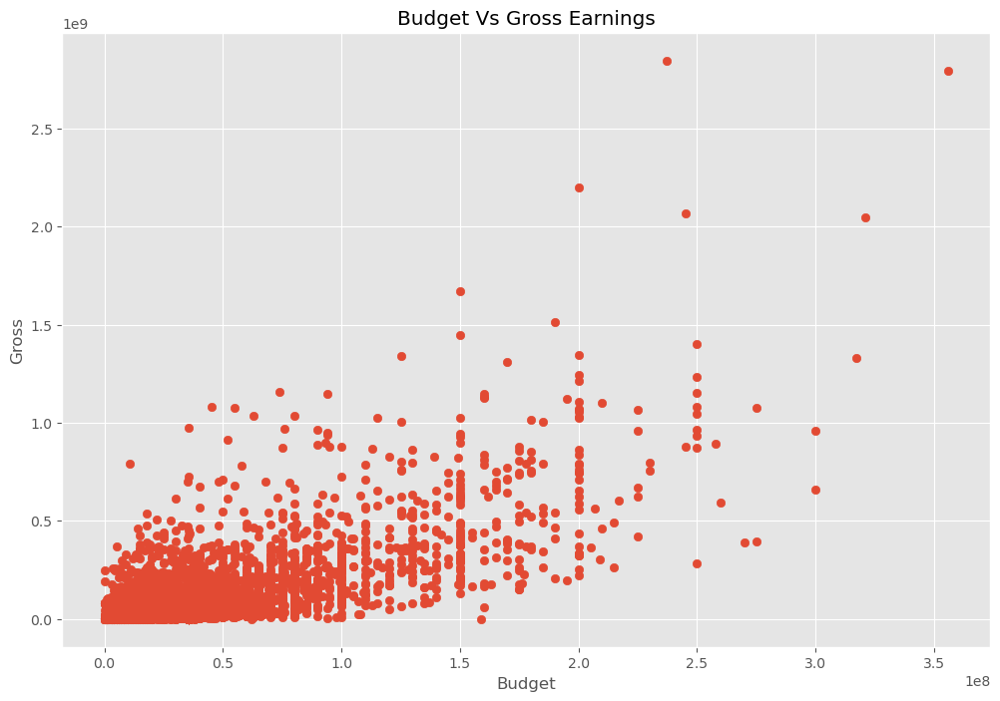

In [169]:
plt.scatter(x='budget',y='gross',data=df)
plt.title('Budget Vs Gross Earnings')
plt.xlabel('Budget')
plt.ylabel('Gross')
plt.show()

<Axes: xlabel='budget', ylabel='gross'>

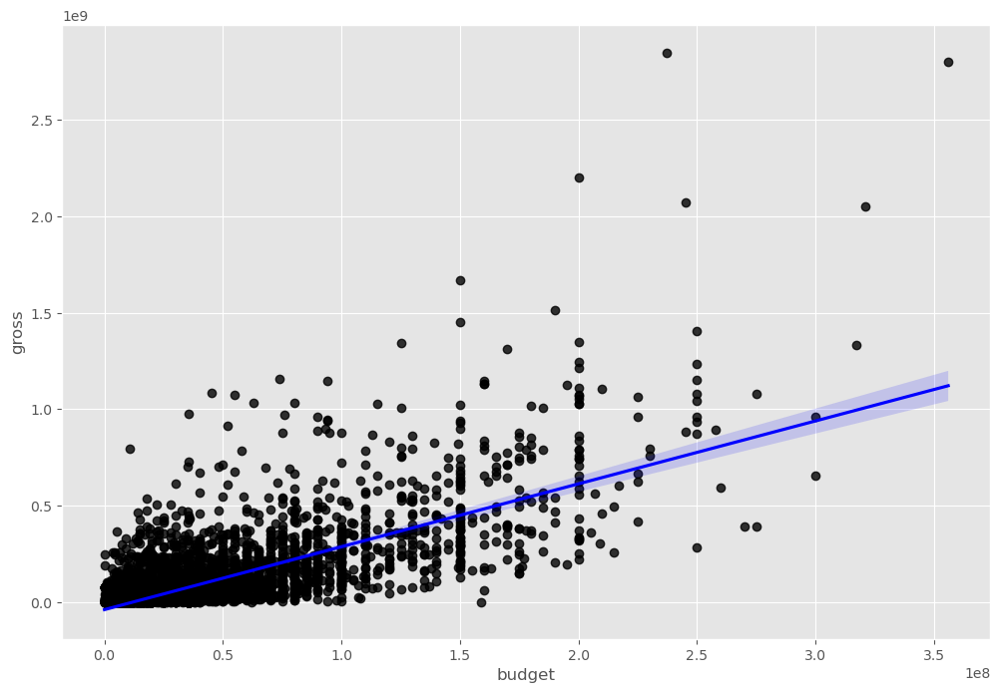

In [171]:
sns.regplot(x='budget',y='gross',data=df,scatter_kws={'color':'black'},line_kws={'color':'blue'})

In [173]:
#lets look at correlation

In [175]:
df[['budget','gross','runtime','score','votes','year']].corr() #by default pearson

,budget,gross,runtime,score,votes,year
budget,1.000000,0.708338,0.264106,0.062531,0.417209,0.263503
gross,0.708338,1.000000,0.242151,0.182448,0.630851,0.249454
runtime,0.264106,0.242151,1.000000,0.397834,0.305903,0.121848
score,0.062531,0.182448,0.397834,1.000000,0.408426,0.103973
votes,0.417209,0.630851,0.305903,0.408426,1.000000,0.224029
year,0.263503,0.249454,0.121848,0.103973,0.224029,1.000000


In [177]:
df[['budget','gross','runtime','score','votes','year']].corr(method='kendall') #by kendal

,budget,gross,runtime,score,votes,year
budget,1.000000,0.255173,0.158862,0.001540,0.156881,0.143621
gross,0.255173,1.000000,0.154411,0.081050,0.505155,0.178553
runtime,0.158862,0.154411,1.000000,0.282559,0.195914,0.096377
score,0.001540,0.081050,0.282559,1.000000,0.302099,0.072574
votes,0.156881,0.505155,0.195914,0.302099,1.000000,0.332281
year,0.143621,0.178553,0.096377,0.072574,0.332281,1.000000


In [179]:
df[['budget','gross','runtime','score','votes','year']].corr(method='spearman') #by spearman

,budget,gross,runtime,score,votes,year
budget,1.000000,0.356902,0.223602,0.001863,0.227954,0.201597
gross,0.356902,1.000000,0.225401,0.118942,0.685295,0.261526
runtime,0.223602,0.225401,1.000000,0.398437,0.286824,0.141721
score,0.001863,0.118942,0.398437,1.000000,0.430827,0.106212
votes,0.227954,0.685295,0.286824,0.430827,1.000000,0.471007
year,0.201597,0.261526,0.141721,0.106212,0.471007,1.000000


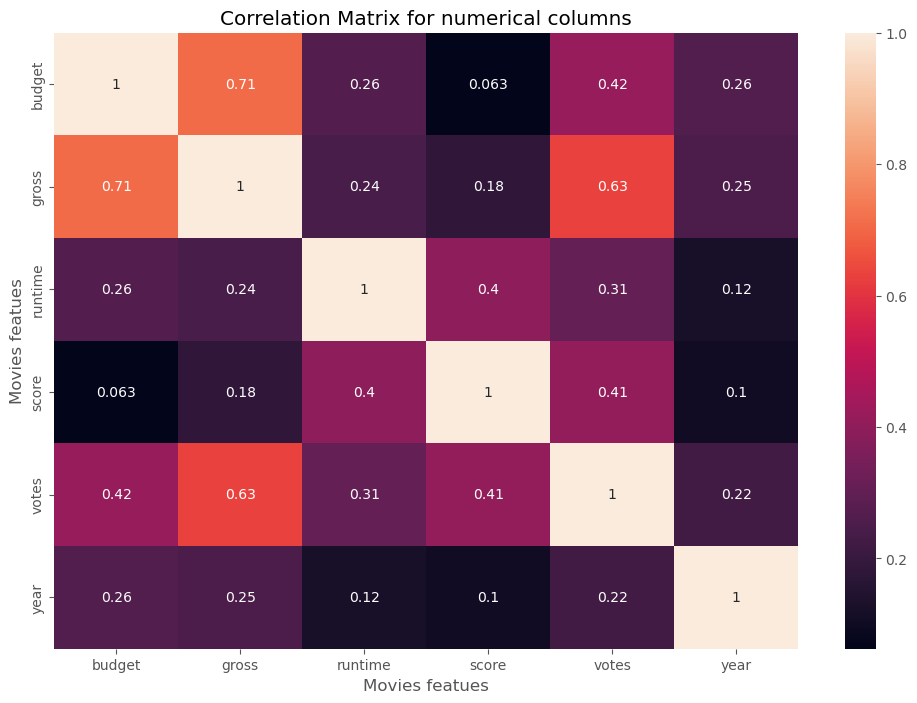

In [181]:
correlation_matrix = df[['budget','gross','runtime','score','votes','year']].corr()
sns.heatmap(correlation_matrix,annot=True)
plt.title('Correlation Matrix for numerical columns')
plt.xlabel('Movies featues')
plt.ylabel('Movies featues')
plt.show()

In [183]:
# Using factorize - this assigns a random numeric value for each unique categorical value

df.apply(lambda x: x.factorize()[0]).corr(method='pearson')

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
name,1.000000,0.157421,0.037159,0.999535,0.993354,-0.047088,0.299057,0.772817,0.831143,0.758947,0.146938,0.288516,0.980948,0.610771,0.048908
rating,0.157421,1.000000,-0.082951,0.159327,0.149609,0.008907,0.105673,0.088284,0.108830,0.096491,0.012730,0.187171,0.158499,-0.019129,0.034872
genre,0.037159,-0.082951,1.000000,0.036987,0.035809,-0.003349,0.022289,0.047773,0.032802,0.037129,-0.015455,0.072260,0.038447,0.008335,0.002548
year,0.999535,0.159327,0.036987,1.000000,0.993257,-0.048176,0.311013,0.770871,0.829638,0.757554,0.143832,0.296032,0.980511,0.605774,0.051570
released,0.993354,0.149609,0.035809,0.993257,1.000000,-0.048854,0.298655,0.771046,0.824588,0.755524,0.152140,0.281889,0.975823,0.612050,0.049262
score,-0.047088,0.008907,-0.003349,-0.048176,-0.048854,1.000000,-0.011099,-0.024733,-0.035614,-0.014223,0.024957,-0.013824,-0.050343,-0.030600,0.027234
votes,0.299057,0.105673,0.022289,0.311013,0.298655,-0.011099,1.000000,0.193925,0.225136,0.179180,-0.044680,0.389733,0.285028,0.008941,0.106201
director,0.772817,0.088284,0.047773,0.770871,0.771046,-0.024733,0.193925,1.000000,0.753727,0.683380,0.158128,0.106740,0.750540,0.557534,-0.009477
writer,0.831143,0.108830,0.032802,0.829638,0.824588,-0.035614,0.225136,0.753727,1.000000,0.679555,0.157381,0.187344,0.810316,0.550050,0.032350
star,0.758947,0.096491,0.037129,0.757554,0.755524,-0.014223,0.179180,0.683380,0.679555,1.000000,0.185056,0.107177,0.736291,0.529774,0.037633


In [185]:
df_numarized = df

In [187]:
for col_name in df_numarized.columns :
    if (df_numarized[col_name].dtype == 'object') :
        df_numarized[col_name] =df_numarized[col_name].astype('category')
        df_numarized[col_name] = df_numarized[col_name].cat.codes
df_numarized

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,6587,6,6,1980,1692,8.4,927000.0,2559,3973,1034,54,19000000,46998772,2293,146.0
1,5573,6,1,1980,1479,5.8,65000.0,2243,1613,320,55,4500000,58853106,724,104.0
2,5142,4,0,1980,1757,8.7,1200000.0,1100,2535,1728,55,18000000,538375067,1523,124.0
3,286,4,4,1980,1479,7.7,221000.0,1289,1978,2224,55,3500000,83453539,1791,88.0
4,1027,6,4,1980,1530,7.3,108000.0,1044,515,403,55,6000000,39846344,1756,98.0
5,2109,6,10,1980,2485,6.4,123000.0,2499,4318,237,55,550000,39754601,1791,95.0
6,5574,6,0,1980,1757,7.9,188000.0,1399,827,1261,55,27000000,115229890,2255,133.0
7,4436,6,3,1980,693,8.2,330000.0,1810,1749,2218,55,18000000,23402427,626,129.0
8,5281,4,0,1980,1739,6.8,101000.0,2280,1957,866,55,54000000,108185706,874,127.0
9,6213,6,3,1980,2270,7.0,10000.0,2832,418,582,55,10000000,15795189,2246,100.0


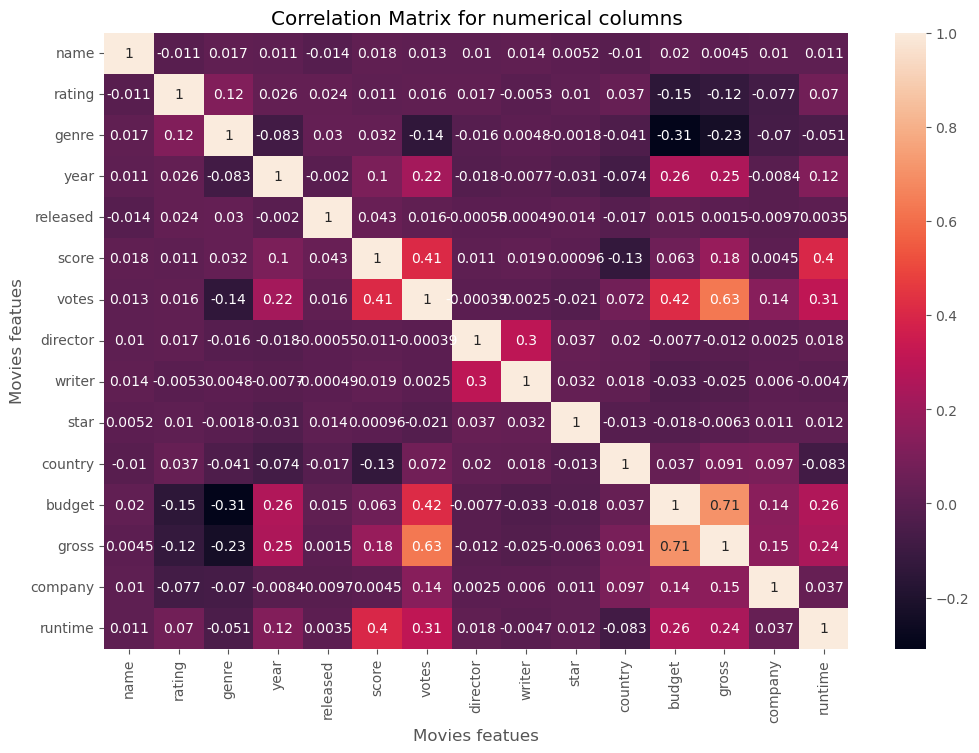

In [189]:
correlation_matrix = df_numarized.corr()
sns.heatmap(correlation_matrix,annot=True)
plt.title('Correlation Matrix for numerical columns')
plt.xlabel('Movies featues')
plt.ylabel('Movies featues')
plt.show()

In [191]:
correlation_mat = df_numarized.corr()
corr_pairs = correlation_mat.unstack()
corr_pairs

name      name        1.000000
          rating     -0.011173
          genre       0.017124
          year        0.010934
          released   -0.013797
          score       0.018349
          votes       0.013294
          director    0.010437
          writer      0.013851
          star        0.005211
          country    -0.010492
          budget      0.019754
          gross       0.004451
          company     0.010387
          runtime     0.010896
rating    name       -0.011173
          rating      1.000000
          genre       0.116645
          year        0.025663
          released    0.024462
          score       0.010575
          votes       0.016355
          director    0.017111
          writer     -0.005337
          star        0.010176
          country     0.036656
          budget     -0.152896
          gross      -0.124396
          company    -0.077425
          runtime     0.070006
genre     name        0.017124
          rating      0.116645
        

In [193]:
sorted_pairs = corr_pairs.sort_values()
sorted_pairs

budget    genre      -0.308255
genre     budget     -0.308255
          gross      -0.232050
gross     genre      -0.232050
budget    rating     -0.152896
rating    budget     -0.152896
votes     genre      -0.144297
genre     votes      -0.144297
score     country    -0.133694
country   score      -0.133694
gross     rating     -0.124396
rating    gross      -0.124396
country   runtime    -0.082960
runtime   country    -0.082960
year      genre      -0.082602
genre     year       -0.082602
company   rating     -0.077425
rating    company    -0.077425
country   year       -0.073515
year      country    -0.073515
genre     company    -0.069863
company   genre      -0.069863
genre     runtime    -0.050938
runtime   genre      -0.050938
genre     country    -0.041136
country   genre      -0.041136
writer    budget     -0.033450
budget    writer     -0.033450
year      star       -0.030553
star      year       -0.030553
gross     writer     -0.024845
writer    gross      -0.024845
star    

In [195]:
high_corr = sorted_pairs[(sorted_pairs)>0.5]
high_corr

gross     votes       0.630851
votes     gross       0.630851
gross     budget      0.708338
budget    gross       0.708338
name      name        1.000000
director  director    1.000000
gross     gross       1.000000
budget    budget      1.000000
country   country     1.000000
star      star        1.000000
writer    writer      1.000000
votes     votes       1.000000
score     score       1.000000
released  released    1.000000
year      year        1.000000
genre     genre       1.000000
rating    rating      1.000000
company   company     1.000000
runtime   runtime     1.000000
dtype: float64

In [197]:
# budget and votes have highest correlation

#and company have the lowest correlation